In [6]:
# We import some useful libraries.
import pandas as pd
import warnings
import numpy as np
import sklearn
from interpret import show
import matplotlib.pyplot as plt

In [2]:
# Load the database from a csv file
data = pd.read_csv(r"C:\Users\garys\Desktop\TFG\TREBALL\BASE DE DADES\diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
# r"../DATA/nomdelcsv.csv
# Change dataframe feature names type to string and modify sex label to gender label
data.columns = data.columns.map(str)
data = data.rename(columns = {'Sex': 'Gender'})
data.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Gender,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


See <https://datascience.stackexchange.com/questions/9443/when-to-use-one-hot-encoding-vs-labelencoder-vs-dictvectorizor>

As we will use a random forest, we will not perform one hot encoding, just label encoding.

In [3]:
# Check the data types. We see all the features are numerical
data.dtypes

Diabetes_binary         float64
HighBP                  float64
HighChol                float64
CholCheck               float64
BMI                     float64
Smoker                  float64
Stroke                  float64
HeartDiseaseorAttack    float64
PhysActivity            float64
Fruits                  float64
Veggies                 float64
HvyAlcoholConsump       float64
AnyHealthcare           float64
NoDocbcCost             float64
GenHlth                 float64
MentHlth                float64
PhysHlth                float64
DiffWalk                float64
Gender                  float64
Age                     float64
Education               float64
Income                  float64
dtype: object

In [4]:
# DataFrame.columns gives us the column labels of the DataFrame.
data.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Gender', 'Age', 'Education',
       'Income'],
      dtype='object')

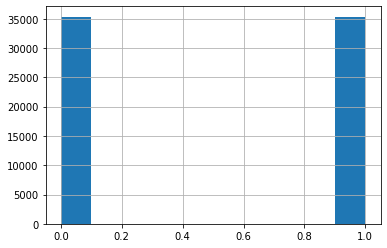

In [5]:
# The dataset is totally balanced
edat = data.loc[:,'Diabetes_binary']
hist = edat.hist()

In [153]:
from sklearn.model_selection import train_test_split

# Separate the target variable 'Diabetes_binary' from the dataframe as we cannot train the model with the target variable
x = data.drop(columns = "Diabetes_binary")
y = data['Diabetes_binary']

# We split the balanced data into train and test dataframes
# random_state seed gives us the same train and test datasets no matter the times we split it, however, here it would not be necessary as we do the split before training our machine learning model
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state = 123)

In [154]:
# How many instances has the test set from the balanced dataframe?
len(X_test)

17673

# Random forest classifier 

In [155]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import model_selection


# Random forest classifier training with default sklearn parameters
rfc = RandomForestClassifier(random_state=123)
rfc.fit(X_train,y_train)

# We predict de test instances to evaluate the model performance with different metrics
rfc_predict = rfc.predict(X_test)

print('\033[1m' + 'Confusion matrix' + '\033[0m', '\n')
print(confusion_matrix(y_test, rfc_predict))

print('\033[1m' + 'Classification report' + '\033[0m', '\n')
print(classification_report(y_test, rfc_predict))

rfc_cv_score = cross_val_score(rfc, X_train, y_train, cv=10, scoring='roc_auc')
print('\033[1m' + 'All AUC scores' + '\033[0m', '\n')
print(rfc_cv_score)

print('\033[1m' + 'Mean AUC score' + '\033[0m')
print(rfc_cv_score.mean())

Confusion matrix 

[[6224 2640]
 [1930 6879]]
Classification report 

              precision    recall  f1-score   support

         0.0       0.76      0.70      0.73      8864
         1.0       0.72      0.78      0.75      8809

    accuracy                           0.74     17673
   macro avg       0.74      0.74      0.74     17673
weighted avg       0.74      0.74      0.74     17673

All AUC scores 

[0.81345612 0.81011617 0.81444819 0.79689688 0.80424542 0.81154814
 0.81283083 0.80969087 0.81446811 0.81332852]
Mean AUC score
0.8101029253010038


Cross validation is performed with the train dataframe. Cross-validation is a resampling method that uses different portions of the data to test and train a model on different iterations. It estimates how accurately the model will perform in practice. We use 10-fold cross-fold cross validation, which means we split the data in 10 portions and we fit the model with nine of the portions and then we validate the model with the remaining portion. We do this 10 times with the 10 possible combinations. The metric used is the area under the curve of the roc curve. See <https://www.youtube.com/watch?v4jRBRDbJemM&t=824s&ab_channel=StatQuestwithJoshStarmer> to understand the roc curve.

## Hyperparameter tuning

In [156]:
from sklearn.model_selection import RandomizedSearchCV
# Useful webs
# 1 - https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html
# 2 - https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

# Parameters grid
n_estimators =  [50, 100, 150, 200, 250] # Number of trees in the random forest
max_features = ['auto', 'sqrt'] # Number of features in consideration at every split
min_samples_split = [2, 4, 6, 8, 10] # Minimum sample number to split a node
min_samples_leaf = [1, 2, 3, 4] # Minimum sample number that can be stored in a leaf node

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'min_samples_split': min_samples_split, 
               'min_samples_leaf': min_samples_leaf}

# Hyperparameter tuning with the RandomizedSearchCV function with a 5-fold cross-validation and  n_iter = 20 random iterations from the parameter grid
rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid,
                                n_iter = 20, cv = 5, verbose=2, random_state=35, n_jobs = -1)
rfc_random.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=123),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 3, 4],
                                        'min_samples_split': [2, 4, 6, 8, 10],
                                        'n_estimators': [50, 100, 150, 200,
                                                         250]},
                   random_state=35, verbose=2)

In [157]:
# We present the best parameters selected in the hyperparameter tuning 

# Grid selected
print ('Random grid: ', random_grid, '\n')

# Best parameters
print ('Best Parameters: ', rfc_random.best_params_, ' \n')

Random grid:  {'n_estimators': [50, 100, 150, 200, 250], 'max_features': ['auto', 'sqrt'], 'min_samples_split': [2, 4, 6, 8, 10], 'min_samples_leaf': [1, 2, 3, 4]} 

Best Parameters:  {'n_estimators': 250, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt'}  



In [158]:
# We fit the random forest classifier with the best parameters selected in the hyperparameter tuning
# See some metrics
rfc_tunned = RandomForestClassifier(n_estimators=250, max_features='sqrt', min_samples_leaf= 4, min_samples_split= 2, random_state=123)
rfc_tunned.fit(X_train,y_train)
rfc_tunned_predict = rfc_tunned.predict(X_test)

print('\033[1m' + 'Confusion matrix' + '\033[0m', '\n')
print(confusion_matrix(y_test, rfc_tunned_predict))

print('\033[1m' + 'Classification report' + '\033[0m', '\n')
print(classification_report(y_test, rfc_tunned_predict))

rfc_tunned_cv_score = cross_val_score(rfc_tunned, X_train, y_train, cv=10, scoring='roc_auc')
print('\033[1m' + 'All AUC scores' + '\033[0m', '\n')
print(rfc_tunned_cv_score)

print('\033[1m' + 'Mean AUC score' + '\033[0m',)
print(rfc_tunned_cv_score.mean())

Confusion matrix 

[[6265 2599]
 [1767 7042]]
Classification report 

              precision    recall  f1-score   support

         0.0       0.78      0.71      0.74      8864
         1.0       0.73      0.80      0.76      8809

    accuracy                           0.75     17673
   macro avg       0.76      0.75      0.75     17673
weighted avg       0.76      0.75      0.75     17673

All AUC scores 

[0.82836008 0.82945417 0.82944316 0.81048408 0.82136196 0.82899793
 0.82571546 0.82989679 0.83216642 0.83131741]
Mean AUC score
0.8267197441162857


The performance in the cross-validation has augmented! Also the classification report has improved!

# Comparision of train and test accuracies

In [159]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('Training set metrics:')
print('Accuracy:', accuracy_score(y_train, rfc_tunned.predict(X_train)))
print('Precision:', precision_score(y_train, rfc_tunned.predict(X_train)))
print('Recall:', recall_score(y_train, rfc_tunned.predict(X_train)))
print('F1:', f1_score(y_train, rfc_tunned.predict(X_train)))
print('---------------')
print('Test set metrics:')
print('Accuracy:', accuracy_score(y_test, rfc_tunned.predict(X_test)))
print('Precision:', precision_score(y_test, rfc_tunned.predict(X_test)))
print('Recall:', recall_score(y_test, rfc_tunned.predict(X_test)))
print('F1:', f1_score(y_test, rfc_tunned.predict(X_test)))

Training set metrics:
Accuracy: 0.8340783492710161
Precision: 0.8120821898529308
Recall: 0.8697667407770283
F1: 0.8399352244400371
---------------
Test set metrics:
Accuracy: 0.7529564872970067
Precision: 0.7304221553780729
Recall: 0.7994096946304915
F1: 0.763360433604336


We clearly see that the trained model in the balanced dataframe does not overfit the non-diabetic class.

# Gini feature importance

In [160]:
# Random forest classifier from sklearn directly permits us to obtain the Gini feature importances. The higher, the more
# important the feature.
rfc_tunned.feature_importances_

array([0.13901135, 0.06651682, 0.00606748, 0.15433275, 0.01746603,
       0.005734  , 0.02337539, 0.01562812, 0.01712869, 0.01240186,
       0.00785465, 0.00307038, 0.00579466, 0.17948079, 0.03321022,
       0.0489218 , 0.03903983, 0.01864062, 0.11265308, 0.03412241,
       0.05954906])

In [161]:
# View the feature scores as a dataframe to plot them
feature_scores = pd.Series(rfc_tunned.feature_importances_, index=x.columns).sort_values(ascending=False)
feature_scores

GenHlth                 0.179481
BMI                     0.154333
HighBP                  0.139011
Age                     0.112653
HighChol                0.066517
Income                  0.059549
PhysHlth                0.048922
DiffWalk                0.039040
Education               0.034122
MentHlth                0.033210
HeartDiseaseorAttack    0.023375
Gender                  0.018641
Smoker                  0.017466
Fruits                  0.017129
PhysActivity            0.015628
Veggies                 0.012402
HvyAlcoholConsump       0.007855
CholCheck               0.006067
NoDocbcCost             0.005795
Stroke                  0.005734
AnyHealthcare           0.003070
dtype: float64

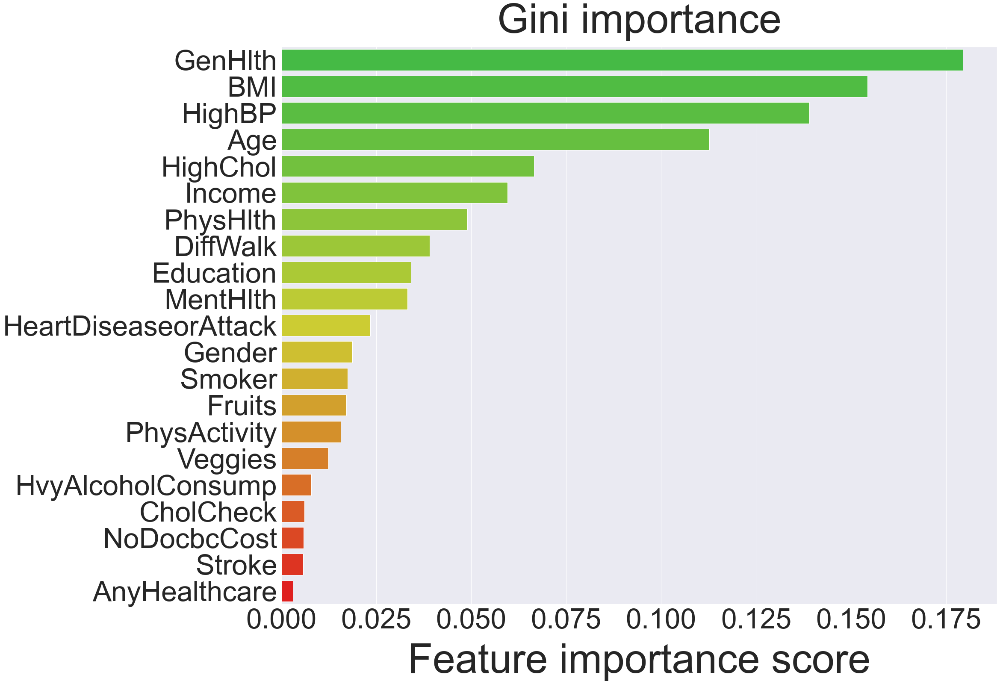

In [162]:
# Creating a seaborn bar plot
from colour import Color
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=6) #  , fontsize=30

# Gradient colour, green - more contribution, red -less contribution
limegreen= Color("limegreen")
colors = list(limegreen.range_to(Color("red"),21))
colors = [color.rgb for color in colors]

f, ax = plt.subplots(figsize=(30, 24))
ax = sns.barplot(x=feature_scores, y=feature_scores.index,palette=colors)
ax.set_title("Gini importance",y=1.02,  fontsize=95)
ax.set_xlabel("Feature importance score", fontsize=95)
ax.xaxis.set_label_coords(0.5, -.07)
plt.show()

#Save the plot for the project memory
f.savefig('GiniImportance.eps', format='eps', dpi=1200, bbox_inches='tight')

In [34]:
# See <https://www.kaggle.com/code/dansbecker/permutation-importance/tutorial>.
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(rfc_tunned, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0382 ± 0.0050,GenHlth
0.0246 ± 0.0047,BMI
0.0194 ± 0.0025,Age
0.0164 ± 0.0025,HighBP
0.0073 ± 0.0030,HighChol
0.0027 ± 0.0017,HeartDiseaseorAttack
0.0021 ± 0.0029,Income
0.0019 ± 0.0007,DiffWalk
0.0017 ± 0.0008,HvyAlcoholConsump
0.0016 ± 0.0012,CholCheck


The first number in each row shows how much model performance decreased with a random shuffling (in this case, using "accuracy" as the performance metric). Like most things in data science, there is some randomness to the exact performance change from a shuffling a column. We measure the amount of randomness in our permutation importance calculation by repeating the process with multiple shuffles. The number after the ± measures how performance varied from one-reshuffling to the next.

In [36]:
# We now calculate the feature permutation importance with the function 'permutation_importance' from sklearn.inspection and 
# we calculate it on the test dataset. See <https://christophm.github.io/interpretable-ml-book/feature-importance.html>.
# We use the default parameters
from sklearn.inspection import permutation_importance
perm_imp = permutation_importance(rfc_tunned, X_test, y_test)


In [37]:
# Permutation importances, we can see as explained before the impotance mean and its standard deviation
perm_imp

{'importances_mean': array([ 1.60470775e-02,  7.26531998e-03,  1.82198834e-03,  2.40592995e-02,
         9.05335823e-05,  1.69750467e-04,  2.89707463e-03, -2.82917445e-04,
         7.92168845e-05,  4.52667912e-04,  1.86725513e-03,  1.69750467e-04,
         1.47117071e-04,  3.76846036e-02,  9.05335823e-05,  1.81067165e-04,
         1.66355457e-03,  2.01437221e-03,  1.91365360e-02,  4.97934703e-04,
         2.08227239e-03]),
 'importances_std': array([0.00163901, 0.00114997, 0.00033456, 0.00191764, 0.00080309,
        0.00056809, 0.00079973, 0.00070673, 0.00074604, 0.00046108,
        0.0003488 , 0.00024006, 0.00031525, 0.00258358, 0.00079909,
        0.00113133, 0.0006497 , 0.00066625, 0.00145559, 0.00054438,
        0.00108511]),
 'importances': array([[ 1.83896339e-02,  1.44287897e-02,  1.49946246e-02,
          1.47682906e-02,  1.76540485e-02],
        [ 6.16760029e-03,  8.71385730e-03,  5.94126634e-03,
          7.01635263e-03,  8.48752334e-03],
        [ 1.75408816e-03,  1.47117071

In [38]:
# View the feature scores as a dataframe to plot them
feature_permutation_scores = pd.Series(perm_imp.importances_mean, index=x.columns).sort_values(ascending=False)
feature_permutation_scores

GenHlth                 0.037685
BMI                     0.024059
Age                     0.019137
HighBP                  0.016047
HighChol                0.007265
HeartDiseaseorAttack    0.002897
Income                  0.002082
Gender                  0.002014
HvyAlcoholConsump       0.001867
CholCheck               0.001822
DiffWalk                0.001664
Education               0.000498
Veggies                 0.000453
PhysHlth                0.000181
AnyHealthcare           0.000170
Stroke                  0.000170
NoDocbcCost             0.000147
MentHlth                0.000091
Smoker                  0.000091
Fruits                  0.000079
PhysActivity           -0.000283
dtype: float64

In [39]:
# Normalize the feature socres to sum 1, so we can compare its relative contribution to the model output change and compare it
# to the Gini importance scores
normalized_feature_permutation_scores= feature_permutation_scores / sum(feature_permutation_scores)
print(normalized_feature_permutation_scores)

GenHlth                 0.318996
BMI                     0.203659
Age                     0.161989
HighBP                  0.135837
HighChol                0.061500
HeartDiseaseorAttack    0.024523
Income                  0.017626
Gender                  0.017051
HvyAlcoholConsump       0.015806
CholCheck               0.015423
DiffWalk                0.014082
Education               0.004215
Veggies                 0.003832
PhysHlth                0.001533
AnyHealthcare           0.001437
Stroke                  0.001437
NoDocbcCost             0.001245
MentHlth                0.000766
Smoker                  0.000766
Fruits                  0.000671
PhysActivity           -0.002395
dtype: float64


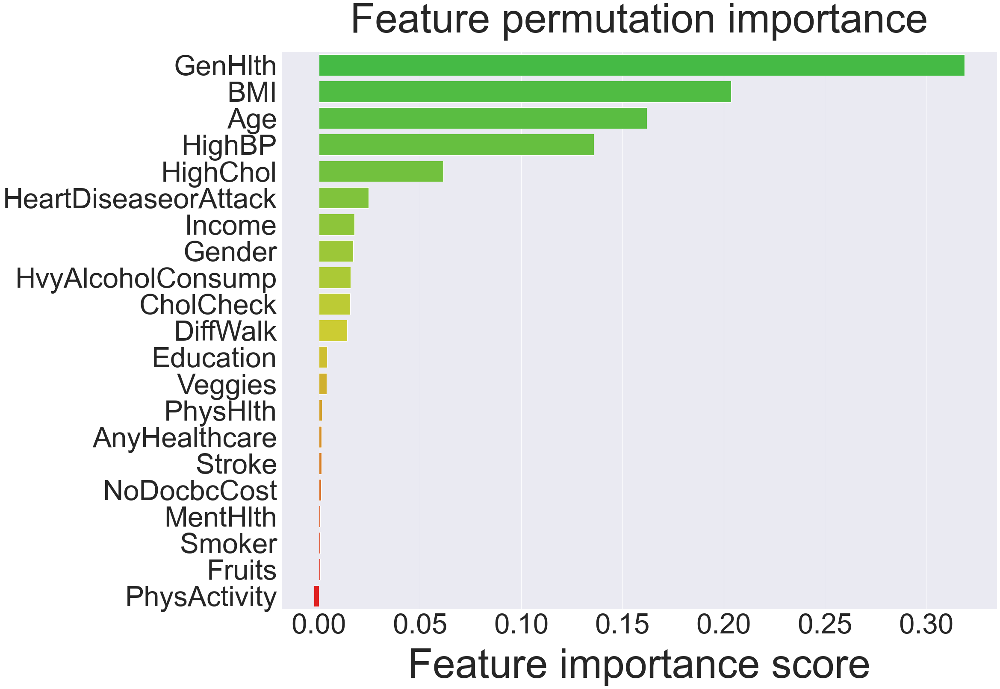

In [40]:
# Creating a seaborn bar plot
from colour import Color
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=6)

limegreen= Color("limegreen")
colors = list(limegreen.range_to(Color("red"),21))
colors = [color.rgb for color in colors]

f, ax = plt.subplots(figsize=(30, 24))
ax = sns.barplot(x=normalized_feature_permutation_scores, y=normalized_feature_permutation_scores.index,palette=colors)
ax.set_title("Feature permutation importance",y=1.03, fontsize=95)
ax.set_xlabel("Feature importance score", fontsize=95)
ax.xaxis.set_label_coords(0.5, -.07)
plt.show()
# Do the plot code
f.savefig('FeaturePermutation.eps', format='eps', dpi=1200,  bbox_inches='tight')
#f.savefig('myimage2.png', format='png', dpi=600)

# LIME

In [312]:
# Consulted websites
# 1- https://towardsdatascience.com/decrypting-your-machine-learning-model-using-lime-5adc035109b5
# 2- https://lime-ml.readthedocs.io/en/latest/lime.html
# 3- https://medium.com/dataman-in-ai/explain-your-model-with-lime-5a1a5867b423
import lime
import lime.lime_tabular

predict_fn_model = lambda x: rfc_tunned.predict_proba(x).astype(float)


# Sampling around instance
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names= ['no diabetes', 'diabetes'],
mode='classification', sample_around_instance=True) 

We could use lasso as surrogate model with feature_selection='lasso_path', however the results do not vary if we do not ask for an specific number of 0 weights. Therefore, we do not use lasso for comodity, as we get a vector with the number of the features in the original dataframe and later we can map these numbers to their corresponding name to get a stylish plot of LIME explanation 

 In our case for widths lower than 1 the explanations are not stable.

## Incorrectly predicted instances

In [310]:
# Get the misclassified instances to see their explanation and see whether they makes sense in a local context
misclassified_samples = X_test[y_test != rfc_tunned.predict(X_test)]
misclassified_samples

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Gender,Age,Education,Income
65720,1.0,1.0,1.0,26.0,1.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,10.0,5.0,7.0
25698,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,11.0,6.0,8.0
23063,0.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,9.0,6.0,8.0
65707,0.0,0.0,1.0,19.0,0.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,3.0,0.0,1.0,0.0,0.0,10.0,5.0,8.0
37695,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,1.0,9.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10641,0.0,0.0,1.0,36.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,8.0,6.0,8.0
56546,0.0,0.0,1.0,35.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,8.0,4.0,6.0
11992,1.0,1.0,1.0,32.0,1.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,5.0
39797,0.0,1.0,1.0,22.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,6.0,8.0


In [313]:
# Many other instances like #11, #23 or #33 are good examples of incorrectly predicted instances, however #277 has been chosen as 
# a mode of example
# Asking for explanation for LIME model on instance number 61 from the misclasified instances
# num_samples = 20.0000 is the number of perturbed points around the instance. After many iterations the explanation does not
# change so we can confirm it is consistent with the sampling around
selected_instance = misclassified_samples.iloc[61]
exp = explainer.explain_instance(selected_instance.values,predict_fn_model,num_features=21, num_samples=20000)
exp.show_in_notebook()

After analising 1 by 1 many individual explanations we can conclude that 'HvyAlcoholConsump' has been interpreted the model the other way around and it contributes to diabetes when it takes the value 0, which is a person who does not consume alcohol and it contributes to non-diabetes for alcochol consumers. Therefore, throught LIME we have detected a feature that globally affects the model output, something we could be able to solve by changing the way we train the model. But this is not the goal here. Trying kernels widhts and what we have already stated about 'HvyAlcoholConsump' is left to the reader. By different kernel width's its meant to see how the variations vary betweeen them with some sort of metric. One also could see at which treshold width the coefficients stabilize.

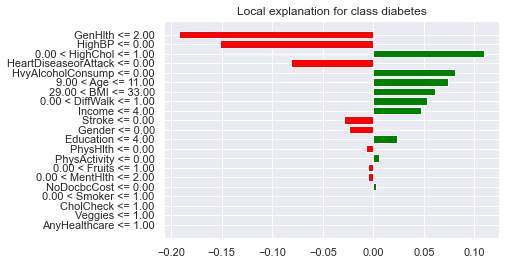

In [200]:
# https://medium.com/dataman-in-ai/explain-your-model-with-lime-5a1a5867b423
# LIME default figure explanation
sns.set(font_scale=1)
fig = exp.as_pyplot_figure(label=1);

## Stylish LIME's explanation

In [201]:
# .as_map() allows us to get the features with its corresponding weights
exp.as_map()

{1: [(13, -0.1918254671728889),
  (0, -0.15177905704742262),
  (1, 0.10931337306234006),
  (6, -0.08186094384024738),
  (10, 0.08039396402603054),
  (18, 0.07418228881320907),
  (3, 0.06058219821395154),
  (16, 0.052796692102574795),
  (20, 0.04673289691336327),
  (5, -0.029358694379194264),
  (17, -0.02391401288261641),
  (19, 0.023292601119428713),
  (15, -0.0073712048594781875),
  (7, 0.005999443840675225),
  (8, -0.005113678070933082),
  (14, -0.004775050465632216),
  (12, 0.003120264158162727),
  (4, -8.353784155482497e-05),
  (2, 0.0),
  (9, 0.0),
  (11, 0.0)]}

In [202]:
# Create a dataframe from exp.as_map() with separated feature index and weight
df=pd.DataFrame.from_dict(exp.as_map())
split_df = pd.DataFrame(df[1].tolist())

In [203]:
# Feature position in the original dataframe
split_df[0].values

array([13,  0,  1,  6, 10, 18,  3, 16, 20,  5, 17, 19, 15,  7,  8, 14, 12,
        4,  2,  9, 11])

In [204]:
# Feature weight for the instance
split_df[1].values

array([-1.91825467e-01, -1.51779057e-01,  1.09313373e-01, -8.18609438e-02,
        8.03939640e-02,  7.41822888e-02,  6.05821982e-02,  5.27966921e-02,
        4.67328969e-02, -2.93586944e-02, -2.39140129e-02,  2.32926011e-02,
       -7.37120486e-03,  5.99944384e-03, -5.11367807e-03, -4.77505047e-03,
        3.12026416e-03, -8.35378416e-05,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00])

In [205]:
# Mapping received ordered features with original dataframe indexes to its name
v=[]
for k in split_df[0].values:
    v.append(data.columns[k+1])
split_df['Feature']=v

# Same with the weights. Assigning each feature its weight in the order of importance
instance=selected_instance.values
w=[]
for k in split_df[0].values:
    w.append(instance[k])
split_df['Value']=w

In [206]:
# Some notational and aestethic modifications
split_df.columns = split_df.columns.map(str)
split_df.drop('0', axis=1, inplace=True)
split_df.rename(columns = {'1':'Weight'}, inplace = True)
split_df = split_df.reindex(columns=['Feature', 'Value', 'Weight'])
split_df

,Feature,Value,Weight
0,GenHlth,2.0,-0.191825
1,HighBP,0.0,-0.151779
2,HighChol,1.0,0.109313
3,HeartDiseaseorAttack,0.0,-0.081861
4,HvyAlcoholConsump,0.0,0.080394
5,Age,11.0,0.074182
6,BMI,33.0,0.060582
7,DiffWalk,1.0,0.052797
8,Income,4.0,0.046733
9,Stroke,0.0,-0.029359


In [207]:
# Stylishing dataframe with the feature instance values and its weight to follow the project style and attach it to the LIME's explanation
df= split_df.style.apply(lambda x: ['color:white' for x in split_df['Weight']])\
              .apply(lambda x: ['background:darkorange' if x >0 else 'background:steelblue' for x in split_df['Weight']])\
              .set_properties(
    **{'border': '1px black solid !important',"font-size": "200%", 'line-height': '8px'})\
    .format({
    'Value': '{:,.0f}'.format
})\
    .set_properties(subset=['Value'], **{'width': '70px'})\
    .set_table_styles([
                            {
                                "selector":"thead",
                                "props": [("font-size", "2.5rem")]}])
df

,Feature,Value,Weight
0,GenHlth,2,-0.191825
1,HighBP,0,-0.151779
2,HighChol,1,0.109313
3,HeartDiseaseorAttack,0,-0.081861
4,HvyAlcoholConsump,0,0.080394
5,Age,11,0.074182
6,BMI,33,0.060582
7,DiffWalk,1,0.052797
8,Income,4,0.046733
9,Stroke,0,-0.029359


In [215]:
# Class probabilites of the instance being explained to plot them in the legend
prob = pd.DataFrame.from_dict(selected_instance)
prediction_probabilities=rfc_tunned.predict_proba(prob.transpose())
prediction_probabilities

array([[0.45791466, 0.54208534]])

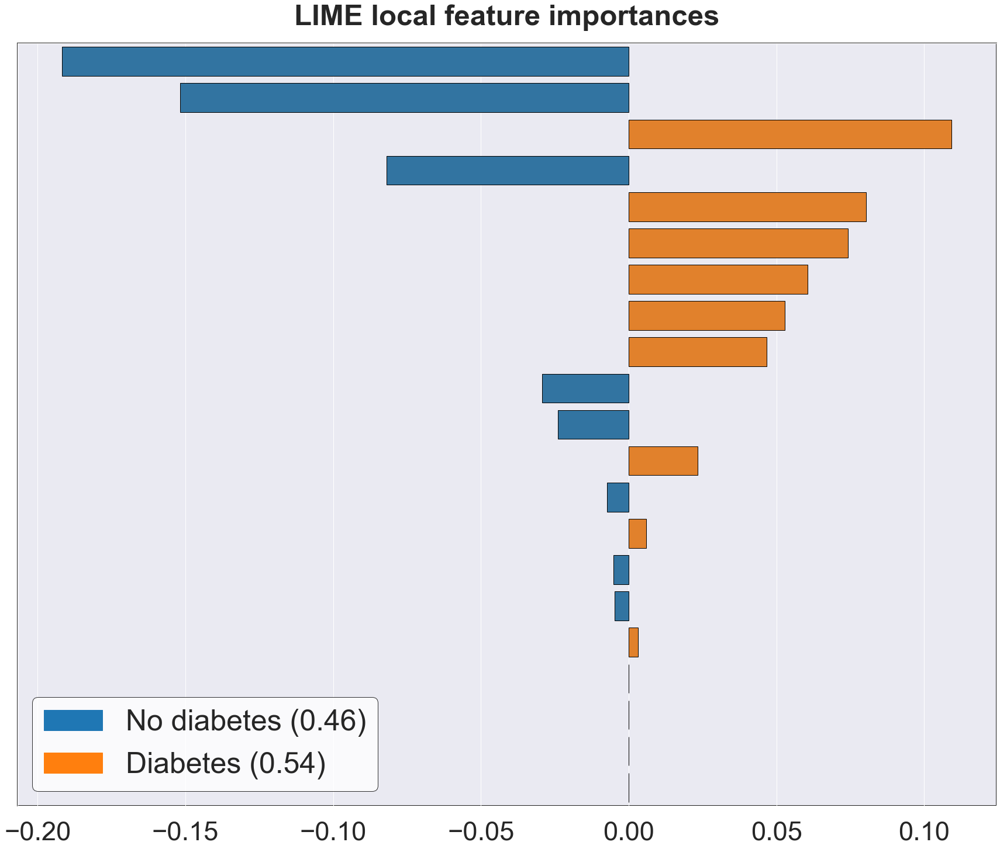

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [216]:
import seaborn as sns
import matplotlib.patches as mpatches
sns.set(font_scale=4.1)

f, ax = plt.subplots(figsize=(30, 24))
clrs = ['tab:blue' if (x < 0) else 'tab:orange' for x in split_df.iloc[:, 2] ]
ax = sns.barplot(x = split_df.iloc[:, 2], y=split_df.iloc[:, 0], palette=clrs, edgecolor='black')
ax.set_title("LIME local feature importances",y=1.02,fontweight="bold")
ax.set_xlabel("")
ax.xaxis.set_label_coords(0.5, -.08)
ax.set_ylabel("")
ax.axes.yaxis.set_ticklabels([])

ax.patch.set_edgecolor('black')  
ax.patch.set_linewidth('2') 

ax.tick_params(axis='x', pad=20) #Separate x axis numbers from the plot

red_patch = mpatches.Patch(color='tab:orange', label='Diabetes (0.54)')
green_patch = mpatches.Patch(color='tab:blue', label='No diabetes (0.46)')
plt.legend(handles=[green_patch,red_patch],loc='lower left',edgecolor='black',prop={'size': 50},facecolor='white')
plt.show()

# bbox_inches='tight' because the feature names were cut off
f.savefig('lime_explanation.eps', format='eps', dpi=1200,  bbox_inches='tight')

## Another example of 'HvyAlcoholConsump' not making sense in the prediction

In [157]:
# In this instance, as already comented, we can see 'HyvAlchohol' contributing to the diabetes class, however all the other
# features  contribute to non-diabetic class with reasonable values
exp = explainer.explain_instance(X_test.iloc[1].values,predict_fn_model,num_features=21, num_samples=20000)
exp.show_in_notebook()

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


# SP-LIME

Calculating the lime explanation for all instances is time-expensive. Here the method uses candidate explanations sampled from the data uniformly at random. The sample size is given by sample_size. Otherwise, explanations will be generated for the entire dataset. We use 500 samples at random and pick the 4 with a highest information coverage. In order to see something new and explore the capabilities of LIME set to 5 the number of features we want for each explanation (the 5 more imporants in each case). From here we can compare it to the global feature importances of the random forest.

In [ ]:
import warnings
warnings.filterwarnings('ignore')
from lime import submodular_pick
# See <https://lime-ml.readthedocs.io/en/latest/lime.html#lime-submodular-pick-module>
# SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model

predict_fn_model = lambda x: rfc_tunned.predict_proba(x).astype(float)
sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, predict_fn_model, num_features=5, sample_size=500, num_exps_desired=4)

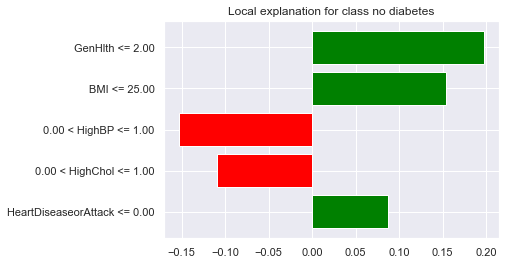

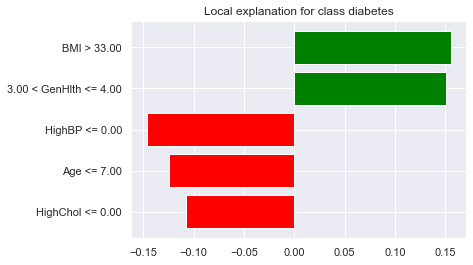

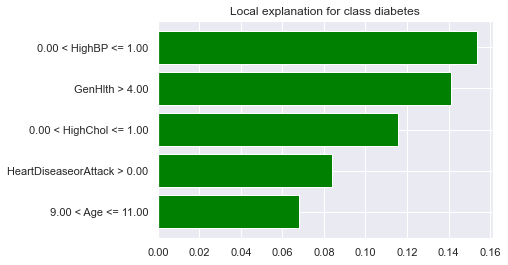

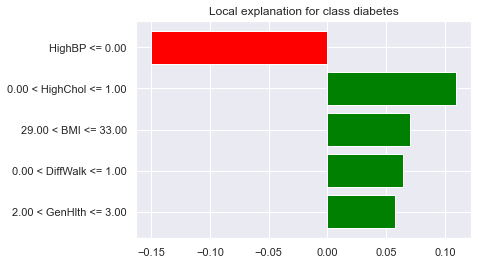

In [51]:
# Plot de SP-LIME results with the LIME author's 'exp.as_pyplot_figure' tool
sns.set(font_scale=1)
for exp in sp_obj.sp_explanations:
      try:
            exp.as_pyplot_figure(label=1)
      except:
        
            exp.as_pyplot_figure(label=0)

Individual savings of the 4 SP-LIME explanations

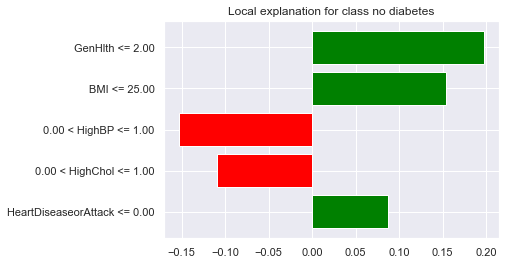

In [74]:
# It plotted two figures. Solved with <https://github.com/marcotcr/lime/issues/89#issuecomment-380766849>.
sp_obj.sp_explanations[0].as_pyplot_figure(label=0);
plt.savefig('splime1.eps', format='eps', dpi=1200,  bbox_inches='tight')

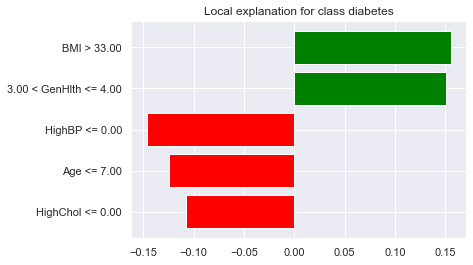

In [75]:
sp_obj.sp_explanations[1].as_pyplot_figure(label=1);
plt.savefig('splime2.eps', format='eps', dpi=1200,  bbox_inches='tight')

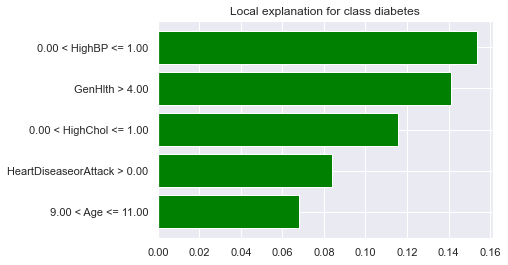

In [76]:
sp_obj.sp_explanations[2].as_pyplot_figure(label=1);
plt.savefig('splime3.eps', format='eps', dpi=1200,  bbox_inches='tight')

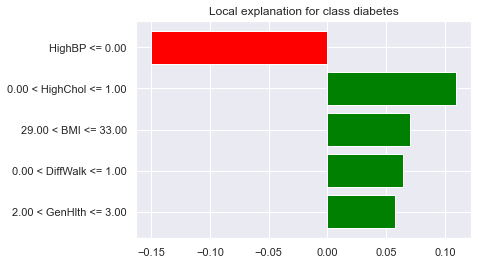

In [77]:
sp_obj.sp_explanations[3].as_pyplot_figure(label=1);
plt.savefig('splime4.eps', format='eps', dpi=1200,  bbox_inches='tight')

In [69]:
# Other framework for visualising the 4 explanations
for exp in sp_obj.sp_explanations:
   fig = exp.show_in_notebook() # Without label = 0 it does not work

If you are wondering if you can get a dataframe with all the lime predictions here is the answer: <https://github.com/marcotcr/lime/issues/213>

# SHAP 

In this section we simply present a SHAP explanation as an example.

In [244]:
# Useful websites:
# 1 - https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/kernel_explainer/Census%20income%20classification%20with%20scikit-learn.html
# 2 - https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

import shap
warnings.filterwarnings('ignore')

# For Jupyter notebook, we need to initialize it with initjs().
shap.initjs()

#KernelExplainer is the model agnostic aproach for calculating the Shapley values
f = lambda x: rfc_tunned.predict_proba(x)[:,1]
med = X_train.median().values.reshape((1,X_train.shape[1]))
explainer = shap.KernelExplainer(f, med)
shap_values_single = explainer.shap_values(selected_instance, nsamples=1000)

shap.force_plot(explainer.expected_value, shap_values_single, selected_instance)

## Base value?

The base value, according to the original SHAP paper, is the mean of the model output
over the background dataset. In our case to impute the missing values for the features
excluded in the Kernel SHAP algorithm, we have used the median of the train dataset.
Therefore our background dataset is formed by one instance where every feature takes
its median in the train dataset. Taking the prediction for this instance we get 0.7594,
which is the probability that the instance is predicted to be diabetic, which is exactly the
base value.

In [219]:
# Base value
explainer.expected_value

0.8044101992422266

In [220]:
# Median of the train dataset features
med

array([[ 1.,  1.,  1., 29.,  0.,  0.,  0.,  1.,  1.,  1.,  0.,  1.,  0.,
         3.,  0.,  0.,  0.,  0.,  9.,  5.,  6.]])

In [221]:
# We find indeed the base value 0.8044102
prediction_probabilities=rfc_tunned.predict_proba(med)
prediction_probabilities

array([[0.1955898, 0.8044102]])

In [223]:
# The shapley values of each feature
shap_values_single

array([-0.2024989 ,  0.        ,  0.        ,  0.02958905,  0.00948653,
        0.        ,  0.        ,  0.00328666,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.15268054,  0.00203458,
        0.        ,  0.04254031,  0.        ,  0.01376942, -0.01537623,
        0.00752426])

In [232]:
shap_instance = pd.DataFrame.from_dict(selected_instance).transpose()

In [233]:
explainer = shap.Explainer(f, med)
shap_values = explainer(shap_instance)

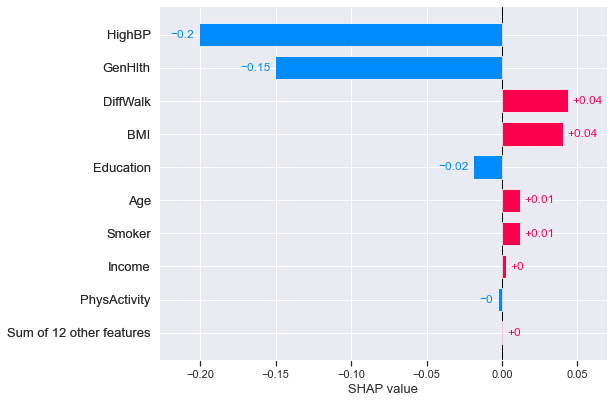

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [245]:
import matplotlib.pyplot as plt

fig=plt.gcf()
shap.plots.bar(shap_values[0])
fig.savefig('shap_barplot.eps', format='eps', dpi=1200,  bbox_inches='tight')

For more elegant python plots visit <https://medium.com/dataman-in-ai/the-shap-with-more-elegant-charts-bc3e73fa1c0c> and <https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/bar.html>.

SHAP implementation offers a good alternative to KernelExplainer if you do not want to use as background dataset the median of the features in the train dataset. If one wants to use a large background set, as opposed to a single reference value, the class Sampling allows one to select the desired background dataset. 


# Tree SHAP

Not explained in the project. It was just to compare the shapley valeus and are similar. The contributions order are literally the same but maybe in a more distributed way.

In [297]:
explainer = shap.TreeExplainer(rfc_tunned)
shap_values = explainer.shap_values(selected_instance)

In [298]:
shap.force_plot(explainer.expected_value[0], shap_values = shap_values[0], features=selected_instance)